In [1]:
# Imports & loading dataset
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
from sqlite3 import connect
import numpy as np
import holoviews as hv
import hvplot.pandas
import panel as pn
from PIL import Image
import IPython
from IPython.display import display
from IPython.display import Video
conn = connect('song_popularity.db')
song_popularity = pd.read_sql('SELECT * FROM song_popularity', conn)

# Getting to Know the Nominated Tracks
***
On November 10th 2023, the Recording Academy announced the 5 nominated tracks for the Best Rock Song category in the 2024 Grammy Awards. Here are the five nominees! The colors used for the label underneath the album cover will also be the colors used to represent each track in our visualizations.

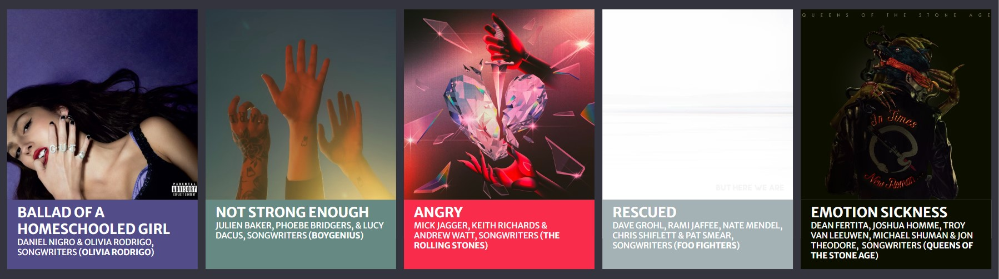

In [2]:
nom_albums = Image.open('media files/nom_albums.jpg')
display(nom_albums)

## Let's listen to a clip of each of them:

In [3]:
from IPython import display
song_clips = ['media files/ballad_clip.mp4','media files/not_strong_enough_clip.mp4',
              'media files/angry_clip.mp4','media files/rescued_clip.mp4',
              'media files/emotion_sickness_clip.mp4']
for s in song_clips:
    display.display(display.Video(s, embed=True,width=240, height=320))

These five songs are all very different from each other, despite all being in the same category. Now that we know which tracks we will be focusing on in our dataset, let's take a look at how these songs compare to the ones that were not nominated in regard to Spotify popularity.

# Spotify Popularity Index
***
As discussed in the abstract, in order to understand how close the Recording Academy's opinions mirror those of the public, I decided to use Spotify to see how popular the songs that submitted for this category are in comparison to each other. According to Spotify's Web API Reference, the popularity index is a number between 0 and 100, with 100 being the most popular. This number is "calculated by algorithm and is based, in the most part, on the total number of plays the track has had and how recent those plays are" ([Spotify for Developers](https://developer.spotify.com/documentation/web-api/reference/get-several-tracks)). This seems like a useful statistic for what I am trying to study, especially given that the how recent the plays are is a factor in the algorithm. If a song has a high popularity index according to Spotify, it is currently being played very often, which tells me that they are currently favored by public opinion. Therefore, using this dataset, I can see how public opinion and the Recording Academy's opinion compare with each other.

# Did the Nominations Impact Spotify Popularity?
***
The dataset used in this project was pulled from Spotify over the span of a month, let's take a look at it!

In [4]:
song_popularity

,timestamp,artist,track,popularity
0,2023-11-04 02:19:36.593707,100 gecs,Dumbest Girl Alive,63
1,2023-11-04 02:19:36.612523,Arctic Monkeys,Sculptures Of Anything Goes,68
2,2023-11-04 02:19:36.631925,Black Pumas,More Than a Love Song,51
3,2023-11-04 02:19:36.649460,"boygenius,Julien Baker,Phoebe Bridgers,Lucy Dacus",Not Strong Enough,77
4,2023-11-04 02:19:36.666892,Dave Matthews Band,Monsters,45
...,...,...,...,...
21975,2023-12-06 17:00:05.093493,Paramore,The News,65
21976,2023-12-06 17:00:05.110575,Queens of the Stone Age,Emotion Sickness,56
21977,2023-12-06 17:00:05.127737,Red Hot Chili Peppers,Tippa My Tongue,61
21978,2023-12-06 17:00:05.144732,The Rolling Stones,Angry,69


The raw data contains the timestamp of when the data was pulled from Spotify, the music artist who performs the track, the name of the track that was submitted, and its Spotify popularity index at that timestamp. As we can see, the data pulling began on 2023-11-04, which was only 6 days before the nominations were announced. In the Abstract, we looked solely at the results of these 6 days of data. We should now take a look at whether the announcement of the nominations had an impact on the popularity of the nominated songs. In order to do this, we'll need to start by making the dataset easier to work with. Look at how much data we have here!

In [5]:
song_popularity.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21980 entries, 0 to 21979
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   timestamp   21980 non-null  object
 1   artist      21980 non-null  object
 2   track       21980 non-null  object
 3   popularity  21980 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 687.0+ KB


That is a LOT of data. In order to visualize it, we will first condense it a bit. Instead of taking every timestamp (which consists of every hour of every day for a month), we will take the mean popularity index of each day for each of the nominated tracks.

In [6]:
# Removing the time portion of the timestamp, we just want the date.
def fix_timestamp(s):
    date, separation, time = s.partition(' ')
    return date

# Aggregating the popularity index by the mean for that day for the track given in the input
def daily_mean_popularity(df,track_name):
    find_track = df['track'] == track_name
    single_track_data = song_popularity.loc[find_track]
    single_track_data.reset_index(drop=True, inplace=True)
    single_track_data = single_track_data.drop(index=[0,1]) # There was some inconsistency with the timestamps of the first two data pulls
    single_track_data['timestamp'] = single_track_data['timestamp'].apply(fix_timestamp)
    aggregator = {'popularity': ['mean']}
    single_track_data_aggregated = single_track_data.groupby('timestamp').agg(aggregator)
    single_track_data_aggregated.columns = ['popularity']
    single_track_data_aggregated.drop(['2023-12-06'],inplace=True) # Having the dataset stop exactly a month after it began
    single_track_data_aggregated.drop(['2023-12-05'],inplace=True)
    return single_track_data_aggregated

Now that we have a function to create a cleaner dataset, we can visualize it!

In [7]:
# Using our function for each of the nominated tracks
ballad = daily_mean_popularity(song_popularity,'ballad of a homeschooled girl')
not_strong_enough = daily_mean_popularity(song_popularity,'Not Strong Enough')
angry = daily_mean_popularity(song_popularity,'Angry')
rescued = daily_mean_popularity(song_popularity,'Rescued')
emotion_sickness = daily_mean_popularity(song_popularity,'Emotion Sickness')

# Creating a line for the date the nominations were released
nomination_date_dict = {'popularity':[0,0,0,0,0,0,90,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]}
timestamps = ballad.index
nomination_date = pd.DataFrame(nomination_date_dict,index=timestamps)
nomination_date.index.rename('timestamp', inplace=True) 

# Creating the plots
c1 = ballad.hvplot.scatter(x='timestamp', y='popularity',label='ballad of a homeschooled girl').opts(
    size=7,color='#524c88') * ballad.hvplot.line(x='timestamp', y='popularity',label='ballad of a homeschooled girl'
                                                      ).opts(color='#524c88')

c2 = not_strong_enough.hvplot.scatter(x='timestamp', y='popularity',label='Not Strong Enough').opts(
    size=7,color='#668a83') * not_strong_enough.hvplot.line(x='timestamp', y='popularity',label='Not Strong Enough'
                                                            ).opts(color='#668a83')

c3 = angry.hvplot.scatter(x='timestamp', y='popularity',label='Angry').opts(
    size=7,color='#fa2c4c') * angry.hvplot.line(x='timestamp', y='popularity',label='Angry').opts(color='#fa2c4c')

c4 = rescued.hvplot.scatter(x='timestamp', y='popularity',label='Rescued').opts(
    size=7,color='#A4b1b5') * rescued.hvplot.line(x='timestamp', y='popularity',label='Rescued').opts(color='#A4b1b5')

c5 = emotion_sickness.hvplot.scatter(x='timestamp', y='popularity',label='Emotion Sickness').opts(
    size=7,color='#0c0e00') * emotion_sickness.hvplot.line(x='timestamp', y='popularity',label='Emotion Sickness'
                                                        ).opts(color='#0c0e00')

bar = nomination_date.hvplot.bar(x='timestamp',y='popularity',hover=False,label='Announcement of nominations').opts(
    fill_alpha=.5,fill_color='#EEEB29',line_alpha=0,bar_width=.5)

# Overlaying all of our plots
(bar * c1 * c2 * c3 * c4 * c5).opts(
    title="Popularity Index of Nominees from 2023-11-04 to 2023-12-04",
    show_grid=True,
    height=350,
    width=800,
    xrotation=60,
    xlabel='Date (Year-Month-Day)',
    ylabel='Popularity Index',
    fontsize={'legend':8,'xticks':8,'title':13},
    ylim=(40,90)
)

:Overlay
   .Bars.Announcement_of_nominations      :Bars   [timestamp]   (popularity)
   .Scatter.Ballad_of_a_homeschooled_girl :Scatter   [timestamp]   (popularity)
   .Curve.Ballad_of_a_homeschooled_girl   :Curve   [timestamp]   (popularity)
   .Scatter.Not_Strong_Enough             :Scatter   [timestamp]   (popularity)
   .Curve.Not_Strong_Enough               :Curve   [timestamp]   (popularity)
   .Scatter.Angry                         :Scatter   [timestamp]   (popularity)
   .Curve.Angry                           :Curve   [timestamp]   (popularity)
   .Scatter.Rescued                       :Scatter   [timestamp]   (popularity)
   .Curve.Rescued                         :Curve   [timestamp]   (popularity)
   .Scatter.Emotion_Sickness              :Scatter   [timestamp]   (popularity)
   .Curve.Emotion_Sickness                :Curve   [timestamp]   (popularity)

There definitely does not appear to be any indication that the nominations caused any changes in the popularity index. None of the tracks experienced an increase in their popularity index following 2023-11-10. Most of them wavered up and down a bit throughout the timeframe, but they never went above what they were leading up to the nominations. 

Although this result might not seem interesting, it does tell us that the tracks' Spotify popularity indices were not swayed by the Recording Academy's opinions, so they still reflect public opinion well. Therefore, going forward, all of the data gathered from 2023-11-04 to 2023-12-04 will be used for analysis.

# Looking at the Entire Dataset
***
Now that we have determined that the nominations did not seem to bias the Spotify data, let us look at the Spotify popularity for all of the songs that were submitted. In order to do this, we will create a new dataframe that organizes all 28 tracks using the function we have already defined for our last plot.

In [8]:
# Creating the dataframe and adding back in the track name so that we can merge
def create_df(track_name):
    graph_data = daily_mean_popularity(song_popularity,track_name)
    graph_data['track'] = track_name
    return graph_data

# Doing this with all 28 tracks!
m1 = create_df('ballad of a homeschooled girl')
m2 = create_df('Not Strong Enough')
m3 = create_df('Angry')
m4 = create_df('Rescued')
m5 = create_df('Emotion Sickness')
m6 = create_df('Lost')
m7 = create_df('GOSSIP (feat. Tom Morello)')
m8 = create_df('F2F')
m9 = create_df('Sculptures Of Anything Goes')
m10 = create_df('The News')
m11 = create_df('Love From The Other Side')
m12 = create_df('Dumbest Girl Alive')
m13 = create_df('Oil (feat. Stevie Nicks)')
m14 = create_df('Ghosts Again')
m15 = create_df('JACK')
m16 = create_df('Tippa My Tongue')
m17 = create_df('Francesca')
m18 = create_df('We’re All Gonna Die (with Noah Kahan)')
m19 = create_df('Wasted (feat. Kodak Black & Koe Wetzel)')
m20 = create_df('World On Fire')
m21 = create_df('Pepper')
m22 = create_df('The Falling Sky')
m23 = create_df('Lux Æterna')
m24 = create_df('Tropic Morning News')
m25 = create_df('More Than a Love Song')
m26 = create_df('Save the World')
m27 = create_df('Monsters')
m28 = create_df('Frenzy')

# Concatenating them back into one dataframe
concat_df = pd.concat([m1,m2,m3,m4,m5,m6,m7,m8,m9,m10,m11,m12,m13,m14,m15,m16,m17,m18,m19,m20,m21,m22,m23,m24,m25,m26,m27,m28])

Let's take a glimpse at our new dataframe.

In [9]:
concat_df

,popularity,track
timestamp,,
2023-11-04,85.000000,ballad of a homeschooled girl
2023-11-05,85.000000,ballad of a homeschooled girl
2023-11-06,85.000000,ballad of a homeschooled girl
2023-11-07,85.000000,ballad of a homeschooled girl
2023-11-08,85.000000,ballad of a homeschooled girl
...,...,...
2023-11-30,35.000000,Frenzy
2023-12-01,35.000000,Frenzy
2023-12-02,35.000000,Frenzy


In [10]:
concat_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 868 entries, 2023-11-04 to 2023-12-04
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   popularity  868 non-null    float64
 1   track       868 non-null    object 
dtypes: float64(1), object(1)
memory usage: 20.3+ KB


Much better! Of course, even with grouping and aggregations this is still a lot of data. Therefore, instead of overlaying the plots of all 28 submitted tracks on top of each other we will use a Select tool! This allows us to view the results of the dataset for each track clearly.

In [11]:
# Creating a cmap for the scatter plot
colorscatter = {'ballad of a homeschooled girl':'#524c88','Not Strong Enough':'#668a83','Angry':'#fa2c4c','Rescued':'#A4b1b5',
'Emotion Sickness':'#0c0e00','Lost':'white','GOSSIP (feat. Tom Morello)':'white','F2F':'white','Sculptures Of Anything Goes':'white',
'The News':'white','Love From The Other Side':'white','Dumbest Girl Alive':'white','Oil (feat. Stevie Nicks)':'white','Ghosts Again':'white',
'JACK':'white','Tippa My Tongue':'white','Francesca':'white','We’re All Gonna Die (with Noah Kahan)':'white',
'Wasted (feat. Kodak Black & Koe Wetzel)':'white','World On Fire':'white','Pepper':'white','The Falling Sky':'white','Lux Æterna':'white',
'Tropic Morning News':'white','More Than a Love Song':'white','Save the World':'white','Monsters':'white','Frenzy':'white'}

# Creating a cmap for the line plot
colorline = {'ballad of a homeschooled girl':'#524c88','Not Strong Enough':'#668a83','Angry':'#fa2c4c','Rescued':'#A4b1b5',
'Emotion Sickness':'#0c0e00','Lost':'black','GOSSIP (feat. Tom Morello)':'black','F2F':'black','Sculptures Of Anything Goes':'black',
'The News':'black','Love From The Other Side':'black','Dumbest Girl Alive':'black','Oil (feat. Stevie Nicks)':'black','Ghosts Again':'black',
'JACK':'black','Tippa My Tongue':'black','Francesca':'black','We’re All Gonna Die (with Noah Kahan)':'black',
'Wasted (feat. Kodak Black & Koe Wetzel)':'black','World On Fire':'black','Pepper':'black','The Falling Sky':'black','Lux Æterna':'black',
'Tropic Morning News':'black','More Than a Love Song':'black','Save the World':'black','Monsters':'black','Frenzy':'black'}

# Creating the Select tool
track_selector = pn.widgets.Select(name='Pick Track',options=['ballad of a homeschooled girl','Not Strong Enough',
'Angry','Rescued','Emotion Sickness','Lost','GOSSIP (feat. Tom Morello)','F2F',
'Sculptures Of Anything Goes','The News','Love From The Other Side','Dumbest Girl Alive','Oil (feat. Stevie Nicks)',
'Ghosts Again','JACK','Tippa My Tongue','Francesca','We’re All Gonna Die (with Noah Kahan)',
'Wasted (feat. Kodak Black & Koe Wetzel)','World On Fire','Pepper','The Falling Sky','Lux Æterna','Tropic Morning News',
'More Than a Love Song','Save the World','Monsters','Frenzy'])

# Defining the dynamic function
@pn.depends(tracks=track_selector)
def plot_concat_df(tracks) -> hv.Scatter:
    mask = concat_df.track == tracks
    scatter = concat_df[mask].hvplot.scatter(x='timestamp', y='popularity',c='track',hover=True,hover_cols=['track']).opts(size=9,cmap=colorscatter,
                                                                                                                          line_color='black') 
    line = concat_df[mask].hvplot.line(x='timestamp', y='popularity',hover_cols=['track']).opts(color=colorline[tracks])
    return (line*scatter).opts(title="Popularity Index from 2023-11-04 to 2023-12-04"+': '+str(tracks),show_grid=True,height=350,width=650,xrotation=60,
    xlabel='Date (Year-Month-Day)',ylabel='Popularity Index',fontsize={'xticks':8,'title':11},ylim=(30,90),show_legend=False,frame_width=600,
    frame_height=300)

pn.Row(track_selector,hv.DynamicMap(plot_concat_df))

BokehModel(combine_events=True, render_bundle={'docs_json': {'176137e9-e9b8-4a64-93af-eab86f460ca6': {'version…

Note that the first 5 tracks listed in the Select panel are the nominated albums. These are colored according to their album cover, whereas the tracks that were not nominated are just white (with a black line connecting them for clarity).

# Mean Spotify Popularity
***
The above visualization does allow us to visualize the entire dataset, but it does not really help us to compare the popularity of the different tracks, since we can only select one at a time. In order to look at this, we will group the dataset by the tracks, and then aggregate the mean popularity index from 2023-11-04 to 2023-12-04.

In [12]:
# Removing track & artist features to make the visualization cleaner
def remove_track_features(s):
    trackname, separation, feature = s.partition('(')
    return trackname

def remove_artist_features(s):
    artist, separation, feature = s.partition(',')
    return artist

# Aggregating the data by mean popularity
aggregator2 = {'popularity': ['mean']}
mean_popularity_data = song_popularity.groupby(['track','artist']).agg(aggregator2)
mean_popularity_data.sort_values(by=('popularity','mean'), ascending=False, inplace=True)
mean_popularity_data.columns=['mean popularity']
mean_popularity_data.reset_index(inplace=True)
mean_popularity_data.set_index('track',inplace=True,drop=True)
mean_popularity_data.index = mean_popularity_data.index.map(remove_track_features)
mean_popularity_data['artist'] = mean_popularity_data['artist'].apply(remove_artist_features)

# Creating a tabulator widget to view our data
pn.extension('tabulator')
mean_popularity_tb = pn.widgets.Tabulator(
    mean_popularity_data,
    page_size=5,
    pagination='local',
    selectable=False,
    disabled=False)

Let's take a look at this dataframe using a tabulator. The tabulator allows us to sort the tracks by their mean popularity in ascending or descending order.

In [13]:
mean_popularity_tb

BokehModel(combine_events=True, render_bundle={'docs_json': {'8372291a-67cf-4e14-996d-d2f3ba5350a5': {'version…

Now let's visualize it to understand it better.

In [14]:
# Creating another cmap
type = ['#524c88','#668a83','#fcfffe','#fcfffe','#fcfffe','#fa2c4c','#fcfffe','#fcfffe','#fcfffe','#fcfffe','#fcfffe',
        '#fcfffe','#fcfffe','#fcfffe','#fcfffe','#fcfffe','#A4b1b5','#fcfffe','#0c0e00','#fcfffe','#fcfffe','#fcfffe',
        '#fcfffe','#fcfffe','#fcfffe','#fcfffe','#fcfffe','#fcfffe']

# Creating our bar plot
mean_popularity_plot = mean_popularity_data.hvplot.bar(
    x='track',
    y='mean popularity',
    hover_cols=['artist']
).opts(title='Mean Spotify Popularity',xlabel='Track Title',ylabel='Popularity',height=380,width=950,xrotation=60,color='track',cmap=type,
    show_legend=False,fontsize={'xticks':8,'xlabel':10,'ylabel':10,'title':13},show_grid=True)

mean_popularity_plot

:Bars   [track]   (mean popularity,artist)

This tabulator and visualization give us the best understanding of our dataset. As we can see, the top 5 tracks (and their artist, hover over the bar to see who that is for each track) according to Spotify popularity are:
1. ballad of a homeschooled girl by Olivia Rodrigo
2. Not Strong Enough by boygenius
3. Lost by Linkin Park
4. GOSSIP by Måneskin
5. F2F by SZA

(Note that this is slightly different from the top 5 given in the abstract, since that only included the data obtained before the nominations were released.) 

These would be the 5 tracks that I would have predicted to be nominated. Here we have 2 of our nominees for Best Rock Song, ballad of a homeschooled girl and Not Strong Enough, in the top 2, whereas the other nominees are not present at all. One of the other nominees, Angry, is trailing right behind F2F, but the final 2, Rescued and Emotion Sickness, seem to be in the lower half of popularity among all the submitted tracks.

# Grammy Wins and 2024 Nominations
***

Just out of curiosity, I would like to create a new, mini dataset from data I gathered from the [2024 GRAMMY Full Nominations list](https://www.grammy.com/news/2024-grammys-nominations-full-winners-nominees-list) and the Grammys artist pages for each of the artists who's songs were nominated for the Best Rock Song award, and the artists who's songs were in the top 5 for Spotify popularity among all the submissions. Those artists are [Olivia Rodrigo](https://www.grammy.com/artists/Olivia-Rodrigo/38411), [boygenius](https://www.grammy.com/artists/boygenius/54205), [The Rolling Stones](https://www.grammy.com/artists/rolling-stones/8331), [Foo Fighters](https://www.grammy.com/artists/foo-fighters/14694), [Queens of the Stone Age](https://www.grammy.com/artists/queens-stone-age/8455), [Linkin Park](https://www.grammy.com/artists/linkin-park/4003), [Måneskin](https://www.grammy.com/artists/maneskin/52284), and [SZA](https://www.grammy.com/artists/Solana-Rowe/32514).

My goal in looking at this data is to see if there is some sort of pattern between the nominated artists (for this category) and a more positive history with the Grammys compared to the artists who weren't nominated.

This new dataset has 6 columns. These columns are Artist (the artist of the track submitted/nominated for Best Rock Song), Track (the title of the track that was submitted/nominated), 2024 Grammys Nominations (the number of Grammys nominations the artist received for the current Grammys), Grammy Award Wins (the total number of Grammys nominations the artist has received), Best Rock Song (whether or not the artist was nominated for Best Rock Song in the 2024 Grammys), and Spotify Top 5 (whether or not the artist is in the top 5 of Spotify popularity among the Best Rock Song submissions)

I present this data as a tabulator, which is very helpful for this specific dataset because of its column sorting ability, and as two bar graphs (one of the "2024 Grammy Nominations" column and another of the "Grammy Award Wins" column) that can be interchanged using the selector tool. The bars of the nominated artists have their signature colors, while the bars of the artists that weren't nominated are just white. The hover tool also provides some of the other information from the dataset. For artists who have a zero bar, you can hover over the line next to their name for the tool.

In [15]:
grammy_stats_data = {'Artist':['Olivia Rodrigo','boygenius','The Rolling Stones','Foo Fighters','Queens of the Stone Age',
                               'Linkin Park','Måneskin','SZA'],
                     'Track':['ballad of a homeschooled girl','Not Strong Enough','Angry','Rescued','Emotion Sickness',
                              'Lost','GOSSIP','F2F'],
                     '2024 Grammys Nominations':[6,6,1,3,2,0,0,9],
                     'Grammy Award Wins':[3,0,3,15,0,2,0,1],
                     'Best Rock Song':['Nominated','Nominated','Nominated','Nominated','Nominated','Not Nominated','Not Nominated','Not Nominated'],
                     'Spotify Top 5':['Yes','Yes','No','No','No','Yes','Yes','Yes']}

grammy_stats = pd.DataFrame(grammy_stats_data)
grammy_stats.set_index('Artist',inplace=True,drop=True)

pn.extension('tabulator')

grammy_stats_tb = pn.widgets.Tabulator(grammy_stats,page_size=5,pagination='local',selectable=False,disabled=False,)

plot_select = pn.widgets.Select(name='Select Plot', options=['2024 Grammys Nominations','Grammy Award Wins'])

@pn.depends(plot_type=plot_select)
def plot_my_data(plot_type):
    mask = ((grammy_stats == grammy_stats) | grammy_stats.isnull()) & (grammy_stats.columns == plot_type)
    masked_plot = grammy_stats[mask]
    masked_plot['Best Rock Song'] = grammy_stats['Best Rock Song']
    masked_plot['Spotify Top 5'] = grammy_stats['Spotify Top 5']
    return masked_plot.hvplot.bar(x='Artist',y=plot_type,invert=True,hover_cols=[
        'Best Rock Song','Spotify Top 5'],flip_yaxis=True,grid=True,legend=False).opts(
        height=300,width=700,ylim=(0,16),title=plot_type,color='Artist',cmap=['#524c88','#668a83','#fa2c4c','#A4b1b5',
                                                                              '#0c0e00','#fcfffe','#fcfffe','#fcfffe'])

interaction = pn.Column(grammy_stats_tb,plot_select,hv.DynamicMap(plot_my_data))
interaction

BokehModel(combine_events=True, render_bundle={'docs_json': {'f4826861-522e-42b2-817d-d66e54a35a5d': {'version…

Although there isn't a clear pattern that jumps out from these graphs, there is some interesting information if you take a closer look at the graphs and tabulator. In the graph of the 2024 Grammy Nominations, SZA certainly seems to be an outlier. The other two songs that were not nominated have 0 nominations for 2024, whereas she has 9! It definitely is interesting that the other two artists have no nominations at all for 2024 despite their clear current popularity. When switching over to wins, one of these artists, Maneskin, also does not have any. Another thing that jumps out is Foo Fighter's 15 total wins! This information combined with their 3 current nominations does seem to indicate that the Recording Academy may favor them, especially given the fact that their nominated song is towards the lower end of Spotify popularity.

# Summary of Data & My Interpretation of the Results
***
There is a lot of data to sift through here. I will focus in on analyzing the data regarding the nominees for Best Rock Song and the artists of the three tracks that were in the top 5 for Spotify popularity but did not receive a nomination for this category.


### Olivia Rodrigo- "ballad of a homeschooled girl"
Olivia Rodrigo submitted her song "ballad of a homeschooled girl" for the Best Rock Song category of the 2024 Grammy Awards. Her song was **nominated**. The Spotify popularity index of her song was consistently at the top (**first**) among all the submissions, with a mean popularity of **~83.36**. Olivia has **6 nominations** for the 2024 Grammy awards and **3 total wins**. Based on this data, it seems that Olivia has a positive reputation with both the general population and the Recording Academy. Olivia Rodrigo seems to be very well liked by the Recording Academy, but it seems this opinion is also shared with the public, making it difficult to claim that her nomination was somehow biased.

### boygenius- "Not Strong Enough" 
Boygenius (stylized boygenius) submitted their song "Not Strong Enough" for the Best Rock Song category of the 2024 Grammy Awards. Their song was **nominated**. The Spotify popularity index of their song was **second** among all the submissions, with a mean popularity of **~76.95**. Boygenius have **6 nominations** for the 2024 Grammy awards and **0 total wins**. Based on this data, it seems that boygenius have a positive reputation with the general population and a currently positive reputation with the Recording Academy, but no reputation historically. Boygenius and Olivia Rodrigo are both very "new" artists compared to the others that were nominated, with these nominations being for Olivia's second album and Boygenius' debut album. Their novelty makes it more difficult to claim that there is any sort of pattern of favoritism or bias towards them from the Recording Academy.

### The Rolling Stones- "Angry"
The Rolling Stones submitted their song "Angry" for the Best Rock Song category of the 2024 Grammy Awards. Their song was **nominated**. The Spotify popularity index of their song was **not in the top 5** among all the submissions, with a mean popularity of **~70.95**. The Rolling Stones have **1 nomination** for the 2024 Grammy awards and **3 total wins**. Based on this data, it seems that The Rolling Stones are currently only somewhat popular with the general population, but have a positive reputation with the Recording Academy. Although this song was not in the top 5 of Spotify popularity over the course of this dataset, it was in the top 6, so it does not seem at all suspicious that it received a nomination.

### Foo Fighters- "Rescued"
Foo Fighters submitted their song "Rescued" for the Best Rock Song category of the 2024 Grammy Awards. Their song was **nominated**. The Spotify popularity index of their song was **not in the top 5** among all the submissions, with a mean popularity of **~57.80**. Foo Fighters have **3 nominations** for the 2024 Grammy awards and **15 total wins!** Based on this data, it seems that Foo Fighters are currently not popular with the general population, but have a very positive reputation with the Recording Academy. It seems that the nomination of this song could be considered an instance of the Recording Academy showing favoritism. This is a band that has been around and successful [since 1994](https://www.grammy.com/artists/foo-fighters/14694). According to [the Grammy's website](https://www.grammy.com/artists/foo-fighters/14694), Foo Fighters currently hold the Grammy record for most wins in the Best Rock Album category. It definitely seems fair to claim that the Recording Academy holds a great appreciation of the Foo Fighters, but without hearing what exactly is discussed in the nomination/wins process, it is hard to say whether this is solely due to favoritism or simply because they believe the music they produce is the greatest of the Rock category.

### Queens of the Stone Age- "Emotion Sickness"
Queens of the Stone Age submitted their song "Emotion Sickness" for the Best Rock Song category of the 2024 Grammy Awards. Their song was **nominated**. The Spotify popularity index of their song was **not in the top 5** among all the submissions, with a mean popularity of **56**. Queens of the Stone Age have **2 nominations** for the 2024 Grammy awards and **0 total wins**. Based on this data, it seems that Queens of the Stone Age are currently not popular with the general population and do not have a very positive reputation with the Recording Academy. It is certainly interesting to see that this song was nominated over songs that are much more well-liked by the public currently. However, they have never won a Grammy and have only received one other nomination this year, so it does not seem to be that they are favored by the Recording Academy. All that can be claimed is there is some difference in opinion between the public and the Recording Academy as to which songs deserve recognition.

### Linkin Park- "Lost"
Linkin Park submitted their song "Lost" for the Best Rock Song category of the 2024 Grammy Awards. Their song was **not nominated**. The Spotify popularity index of their song was **third** among all the submissions, with a mean popularity of **~75.47**. Linkin Park have **0 nominations** for the 2024 Grammy awards, but **2 total wins**. Based on this data, it seems that Linkin Park are very popular with the general population, but currently not popular with the Recording Academy. However, they do have two previous wins which imply that the Recording Academy is not biased against them.

### Maneskin- "GOSSIP"
Maneskin submitted their song "Lost" for the Best Rock Song category of the 2024 Grammy Awards. Their song was **not nominated**. The Spotify popularity index of their song was **fourth** among all the submissions, with a mean popularity of **~75.25**. Maneskin have **0 nominations** for the 2024 Grammy awards & **0 total wins**. Based on this data, it seems that Maneskin are very popular with the general population, but definitely not with the Recording Academy. It seems that Maneskin is the opposite of Foo Fighters. Their song is doing very well on Spotify and therefore is being listened to often by the public, but they have not received any sort of recognition from the Recording Academy this year. According to the Grammy website they do have 1 previous nomination for Best New Artist last year. Therefore, the Recording Academy is aware of their work and believes they are on the rise, but for some reason did not give them any additional recognition this year despite their current steady popularity. It is difficult to decipher why.

### SZA- "F2F"
SZA submitted her song "F2F" for the Best Rock Song category of the 2024 Grammy Awards. Their song was **not nominated**. The Spotify popularity index of her song was **fifth** among all the submissions, with a mean popularity of **~71.88**. SZA has **9 nominations** for the 2024 Grammy awards and **1 total win**. Based on this data, it seems that SZA is very popular with the general population and is also currently extremely well-liked by the Recording Academy. SZA is really the outlier of the artists that did not receive this nomination. Despite not receiving this specific nomination, [SZA is actually the most nominated artist in the 2024 Grammys.](https://www.grammy.com/news/2024-grammys-nominees-takeaways-most-nominations-firsts) Therefore, it would be completely unfounded to claim that the Recording Academy has anything against her or her work. There simply must be some other aspect about the track itself or the nomination process that led to this outcome.

# Conclusion & Future Directions
***

It seems that the only clear instance that could be deemed favoritism is the nomination of Rescued. This track is really on the lower end of Spotify popularity and yet it still received a nomination, one that accompanies two others for the 2024 Grammys and 15 past wins. Alternatively, the only clear instance of possible bias against an artist is the zero nominations of Maneskin. This track was fourth in popularity among the submissions despite the album being released all the way back in January 2023. Do these two instances provide enough evidence to say that the Grammys are ["disconnected from regular music listeners"](https://thescarlet.org/18602/larts/why-do-the-grammy-nominations-always-suck/)? Of course not, but they also certainly do not help [the argument of the Recording Academy against the accusations regarding rigging nominations](https://www.rollingstone.com/music/music-news/grammys-vote-rigging-statement-942137/amp/) either. 

If this data analysis was repeated for every Grammys category, there would certainly be a more concise answer to these accusations. However, just by looking at this one category there are more than one clear occasions of difference in public opinion and the opinion of the Recording Academy. Although there is, without argument, more to the Grammy nomination process other than just public opinion. For one, there could definitely be more to judging the technical music aspect that average listeners are unaware of/do not think about when clicking on a song they want to listen to in Spotify. However, as an organization that [claims to be of "service" to the entire music community](https://www.recordingacademy.com/about), should the factor of the opinions of average music listeners play a more significant role? That may be debatable. 

It will definitely be interesting to see which of these nominees end up winning the Best Rock Song category and how the public reacts to the winner. Will it be the song with the greatest Spotify popularity, "ballad of a homeschooled girl" by Olivia Rodrigo? Will it be the song of the artist that has the most previous wins, "Rescued" by Foo Fighters? Will it be my personal favorite, "Not Strong Enough" by boygenius? We will see on February 4th, 2024!

# Sources
***
- Dataset source: Spotify
- Dataset repository: https://github.com/ruc-data-viz/viz-julesstellwag-final-project-data
- List of submissions: https://www.onthebulletin.com/2024-grammys-watch/official-submissions-list
- The statement by the Recording Academy: https://www.rollingstone.com/music/music-news/grammys-vote-rigging-statement-942137/amp/
- The Scarlet article: https://thescarlet.org/18602/larts/why-do-the-grammy-nominations-always-suck/
- 2024 Nomination information: https://www.grammy.com/news/2024-grammys-nominations-full-winners-nominees-list
- Total Grammy wins information:
    - [Olivia Rodrigo](https://www.grammy.com/artists/Olivia-Rodrigo/38411)
    - [boygenius](https://www.grammy.com/artists/boygenius/54205)
    - [The Rolling Stones](https://www.grammy.com/artists/rolling-stones/8331)
    - [Foo Fighters](https://www.grammy.com/artists/foo-fighters/14694)
    - [Queens of the Stone Age](https://www.grammy.com/artists/queens-stone-age/8455)
    - [Linkin Park](https://www.grammy.com/artists/linkin-park/4003)
    - [Måneskin](https://www.grammy.com/artists/maneskin/52284)
    - [SZA](https://www.grammy.com/artists/Solana-Rowe/32514)
- SZA most nominated artist in 2024: https://www.grammy.com/news/2024-grammys-nominees-takeaways-most-nominations-firsts
- Spotify Web API Reference: https://developer.spotify.com/documentation/web-api/reference/get-several-tracks
- Recording Academy about us page: https://www.recordingacademy.com/about